# BNHL integration for the full cohort

In [1]:
import cytovi
import scanpy as sc
import readfcs
import os
import anndata as ad
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy.stats import mannwhitneyu
from sklearn.cluster import KMeans
import math
from scipy.optimize import linear_sum_assignment
import pingouin as pg
from adjustText import adjust_text
import scvi

/home/projects/amit/floriani/mambaforge/envs/cytovi_gpu/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_use_gpu' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


In [3]:
# settings
os.chdir('/home/projects/amit/floriani/Lab/PROJECTS/FlowVI/notebooks')
figure_dir = '../figures/figure4/'

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams["savefig.dpi"] = 300

sc.settings.figdir = figure_dir
sc.set_figure_params(dpi_save = 300)
sc.settings.n_jobs = 30

# Preprocessing of data

In [4]:
# read flow data again
flow_data_dir = '/home/projects/amit/floriani/Lab/PROJECTS/FlowVI/data/raw/Flow cytometry/BNHL/'

In [ ]:
# load panel 1
panel_id = str(1)
flow_batches = os.listdir(flow_data_dir + 'panel' + panel_id)

# read data
vars_rm = ['Time', 'FSC-H', 'FSC-W', 'SSC-H', 'SSC-W', 'Viability']

adata_batch_list = []

for flow_batch in flow_batches:
    fcs_folder_path = flow_data_dir + 'panel' + panel_id + '/' + flow_batch + '/Panel' + panel_id + '_gated/'
    fcs_files = os.listdir(fcs_folder_path)
    adata_list = []
    sample_num = 0
    
    for fcs_file in fcs_files:
        if fcs_file.endswith('.fcs'):
            adata = readfcs.read(fcs_folder_path + fcs_file)
            adata = adata[:, [var for var in adata.var_names if var not in vars_rm]]

            # add md
            adata.obs['filename'] = fcs_file
            adata.obs['sample_id'] = sample_num
            adata.obs['panel'] = 'panel' + panel_id
            adata.obs['PatientID'] = fcs_file.split('_')[3]

            adata.layers['raw'] = adata.X.copy()
        
            sample_num += 1
            adata_list.append(adata)

    adata_batch = ad.concat(adata_list, join="outer")

    # transform and scale
    cytovi.pp.arcsinh(adata_batch, global_scaling_factor=500, transform_scatter = True)
    cytovi.pp.scale(adata_batch)

    adata_batch_list.append(adata_batch)

In [ ]:
# read flow data for panel 2 and append batches
panel_id = str(2)
flow_batches = os.listdir(flow_data_dir + 'panel' + panel_id)

# read data
vars_rm = ['Time', 'FSC-H', 'FSC-W', 'SSC-H', 'SSC-W', 'Viability']

for flow_batch in flow_batches:
    fcs_folder_path = flow_data_dir + 'panel' + panel_id + '/' + flow_batch + '/Panel' + panel_id + '_gated/'
    fcs_files = os.listdir(fcs_folder_path)
    adata_list = []
    # sample_num = 0
    
    for fcs_file in fcs_files:
        if fcs_file.endswith('.fcs'):
            adata = readfcs.read(fcs_folder_path + fcs_file)
            adata = adata[:, [var for var in adata.var_names if var not in vars_rm]]

            # add md
            adata.obs['filename'] = fcs_file
            adata.obs['sample_id'] = sample_num
            adata.obs['panel'] = 'panel' + panel_id
            adata.obs['PatientID'] = fcs_file.split('_')[3]

            adata.layers['raw'] = adata.X.copy()
        
            sample_num += 1
            adata_list.append(adata)

    adata_batch = ad.concat(adata_list, join="outer")

    # transform and scale
    cytovi.pp.arcsinh(adata_batch, global_scaling_factor=500, transform_scatter = True)
    cytovi.pp.scale(adata_batch)

    adata_batch_list.append(adata_batch)

In [ ]:
# combine batches
adata_flow = cytovi.pp.merge_batches(adata_batch_list)

# read md and merge with anndata
md = pd.read_excel(flow_data_dir + '2024-11-06_BNHL_md.xlsx')
adata_flow.obs = pd.merge(adata_flow.obs, md, on='PatientID')
adata_flow

In [ ]:
# save anndata
adata_flow.write_h5ad(flow_data_dir + '2024-11-19_BNHL_flow_both_panels_combined.h5ad')

# Train flow flow model

In [ ]:
# read model and adata again
adata_flow = ad.read_h5ad(flow_data_dir + '2024-11-26_BNHL_flow_both_panels_combined_10k_per_patient_integrated_imputed_DA_res.h5ad')
model = cytovi.CytoVI.load('/home/labs/amit/floriani/Lab/PROJECTS/FlowVI/models/BNHL/2024-11-26_flow_imputation_10K_per_patient', adata = adata_flow)

In [ ]:
# check convergance
plt.subplot(1, 2, 1)
plt.plot(model.history['elbo_train'])
plt.xlabel('epochs')
plt.ylabel('elbo_train')

plt.subplot(1, 2, 2)
plt.plot(model.history['elbo_validation'])
plt.xlabel('epochs')
plt.ylabel('elbo_validation')

In [ ]:
# plot latent space
adata_flow_sub = cytovi.pp.subsample(adata_flow, n_obs = 100000, groupby= 'Entity')
sc.pp.neighbors(adata_flow_sub, use_rep='X_CytoVI')
sc.tl.umap(adata_flow_sub)
sc.pl.umap(adata_flow_sub, color=['batch', 'Entity'])
sc.pl.umap(adata_flow_sub, color= adata_flow_sub.var_names, layer = 'imputed')

# Annotate flow data

In [ ]:
# cluster latent space
sc.pp.neighbors(adata, use_rep='X_CytoVI')
sc.tl.leiden(adata, key_added='leiden_CytoVI', resolution = 0.4)

In [ ]:
adata_flow_sub.obs['leiden_CytoVI'] = adata.obs['leiden_CytoVI'][adata_flow_sub.obs_names]
sc.pl.umap(adata_flow_sub, color='leiden_CytoVI')

In [ ]:
sc.pl.matrixplot(adata, adata_flow_sub.var_names, groupby='leiden_CytoVI', cmap='viridis', dendrogram=True, layer = 'imputed', standard_scale='var')

In [ ]:
# annotate cells
ann_dict = {'10': 'Tpr',
             '15': 'Tpr',
             '14': 'Th CM2',
             '13': 'Tdn',
             '16': 'Tdp',
             '8': 'Ttox EM1',
             '11': 'Naive CD8 T',
             '0': 'Ttox EM3',
             '4': 'Ttox EM2',
             '5': 'Tfh',
             '7': 'Treg CD69-',
             '2': 'Th CM1',
             '6': 'Th CM1',
             '9': 'Naive CD4 T',
             '12': 'Naive CD4 T',
             '1': 'Treg CD69+',
             '3': 'Th CM2'
              }

adata.obs['cell_type'] = adata.obs['leiden_CytoVI'].astype(str).map(ann_dict)

adata_flow_sub.obs['cell_type'] = adata.obs['cell_type'][adata_flow_sub.obs_names]
sc.pl.umap(adata_flow_sub, color='cell_type')

In [ ]:
# save anndata
adata.write_h5ad(flow_data_dir + '2024-12-02_BNHL_flow_both_panels_combined_10k_per_patient_integrated_imputed_DA_res_annotated.h5ad')

In [ ]:
# read again
adata_flow = ad.read_h5ad(flow_data_dir + '2024-12-02_BNHL_flow_both_panels_combined_10k_per_patient_integrated_imputed_DA_res_annotated.h5ad')

In [ ]:
# subsample and compute umap figures
adata_flow_sub = cytovi.pp.subsample(adata_flow, n_obs = 100000, groupby= 'Entity')
sc.pp.neighbors(adata_flow_sub, use_rep='X_CytoVI', n_neighbors = 10)
sc.tl.umap(adata_flow_sub, min_dist = 0.1)

In [ ]:
sc.pl.umap(adata_flow_sub, color= adata_flow_sub.var_names, layer = 'imputed', cmap='mako', frameon=False, vmin = 0.1, save = 'flow_integrated_all_markers.png')

In [ ]:
# plot umap with panels
panel_colors = ['#00A9B8', '#F6B319']
sc.pl.umap(adata_flow_sub, color='panel', palette = panel_colors, frameon = False, save = 'panel.png')

In [ ]:
batch_cols = ['#6492CC', '#00A9B8', '#3A528A', '#DEAE5E', '#DD5126', '#BB4326', '#56C09F', '#79663B', '#DEC75E', '#B5792E', '#F6B319', '#395E5C', 
                '#C67129', '#056080', '#A6291C', '#8FA7D4', '#6492CC', '#C67129', '#527BA6', '#39445E', '#D3D3D3', '#5C6B8A', '#527F7D', '#4A6362',
                 '#B5722E', '#4D4E38', '#AD8533', '#A1462B']
sc.pl.umap(adata_flow_sub, color='batch', palette = batch_cols, frameon = False, save = 'batch.png')

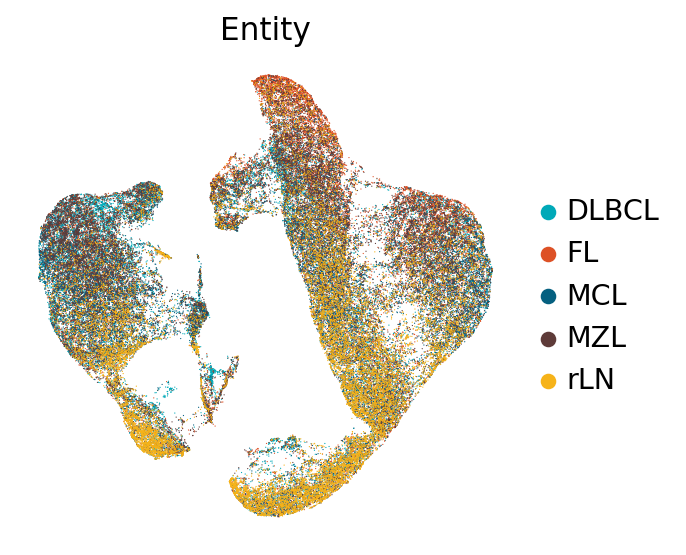

In [67]:
color_dict_entities = {
    'rLN': '#F6B319',
    'DLBCL': '#00A9B8',
    'FL': '#DD5126',
    'MCL': '#056080',
    'MZL': '#5E3B39',  
}

sc.pl.umap(adata_flow_sub, color='Entity', palette = color_dict_entities, frameon=False, save = 'entities.png')

In [ ]:
color_dict = {
    'Naive CD4 T': '#3A528A', 
    'Naive CD8 T': '#DD5126',
    'Tdn': '#DEC75E',       
    'Tdp': '#5E3B39',        
    'Tfh': '#056080',   
    'Th CM1': '#6492CC',    
    'Th CM2': '#39445E', 
    'Tpr': '#575E38',    
    'Treg CD69+': '#00A9B8', 
    'Treg CD69-': '#56C09F',  
    'Ttox EM1': '#C67129', 
    'Ttox EM2': '#DEAE5E',  
    'Ttox EM3': '#F6B319' 
}

sc.pl.umap(adata_flow_sub, color='cell_type', palette = color_dict, frameon=False, save = 'cell_type_annotations.png')

In [ ]:
sc.pl.matrixplot(adata_flow_sub, adata_flow_sub.var_names, groupby='cell_type', cmap='mako', dendrogram=True, layer = 'imputed', standard_scale='var', save='cell_type_markers.pdf')

In [ ]:
# save
adata_flow_sub.write(flow_data_dir + '2024-12-11_BNHL_flow_both_panels_combined_10k_per_patient_integrated_imputed_DA_res_annotated_sub_for_fig.h5ad')

In [ ]:
# read again
adata_flow_sub = ad.read_h5ad(flow_data_dir + '2024-12-11_BNHL_flow_both_panels_combined_10k_per_patient_integrated_imputed_DA_res_annotated_sub_for_fig.h5ad')

# Label free DA analysis

In [ ]:
# compute log medium exp for all entities
# read log probs
log_probs = pd.read_csv(flow_data_dir + '2024-11-26_BNHL_flow_both_panels_combined_10k_per_patient_DA_log_probs.csv', index_col = 0)

def log_median(x):
    return np.log(np.median(np.exp(x), axis = 1))

for cond_oi in adata_flow.obs['Entity'].cat.categories:
    md = adata_flow.obs[['PatientID', 'Entity']].drop_duplicates()
    cases = md.set_index('PatientID').loc[[*log_probs.columns],:]['Entity']==cond_oi


    log_prop_cases = log_median(log_probs.loc[:,cases])
    log_prop_controls = log_median(log_probs.loc[:,~cases])

    log_ratios = log_prop_cases - log_prop_controls

    adata_flow.obs[f'Logmedian_DA_{cond_oi}'] = log_ratios
    adata_flow_sub.obs[f'Logmedian_DA_{cond_oi}'] = adata_flow.obs[f'Logmedian_DA_{cond_oi}'][adata_flow_sub.obs_names]

In [ ]:
# Plot all DAs with the truncated colormap
fig, axes = plt.subplots(1, 5, figsize=(20, 4))

group_order = ['rLN', 'DLBCL', 'MCL', 'FL', 'MZL']

for i, cond_oi in enumerate(group_order):
    sc.pl.umap(
        adata_flow_sub,
        color=[f'Logmedian_DA_{cond_oi}'],
        cmap='icefire',
        vmin=-3,
        vmax=3,
        vcenter = 0,
        ax=axes[i],
        show=False,
        frameon=False
    )

plt.tight_layout()
plt.savefig(figure_dir + 'DA_log_median_all_entities.png')
plt.show()

In [ ]:
# Plot the scale bar separately
fig, ax = plt.subplots(figsize=(2, 6))
cmap = sns.color_palette('icefire', as_cmap=True)
norm = matplotlib.colors.Normalize(vmin=-3, vmax=3)
sm = matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

cbar = plt.colorbar(sm, cax=ax, orientation='vertical')
cbar.set_label('Logmedian_DA', fontsize=12)
plt.tight_layout()
plt.savefig(figure_dir + 'DA_colorbar.pdf')
plt.show()

In [ ]:
# extract DA score and concat them with latent
da_scores = adata_flow.obs[[obs for obs in adata_flow.obs.columns if obs.startswith('Logmedian_DA_')]].copy().to_numpy()

da_latent = np.hstack((da_scores, adata_flow.obsm['X_CytoVI']))

kmeans = KMeans(n_clusters=13, random_state=0).fit(da_latent)
adata_flow.obs['da_cluster'] = kmeans.labels_.astype('str')

In [ ]:
# bring DA cluster label to subset
adata_flow_sub.obs['da_cluster'] = adata_flow.obs['da_cluster'][adata_flow_sub.obs_names]
sc.pl.umap(adata_flow_sub, color = 'da_cluster', frameon = False, palette= batch_cols, save = 'da_cluster.png')

In [ ]:
# compute confusion matrix
confusion_matrix_df = sc.metrics.confusion_matrix("cell_type", "da_cluster", adata_flow.obs)

# reorder
n_rows, n_cols = confusion_matrix_df.shape

if n_rows > n_cols:
    padded_confusion_matrix = np.pad(confusion_matrix_df.values, ((0, 0), (0, n_rows - n_cols)), mode='constant')
else:
    padded_confusion_matrix = np.pad(confusion_matrix_df.values, ((0, n_cols - n_rows), (0, 0)), mode='constant')

cost_matrix = padded_confusion_matrix.max() - padded_confusion_matrix
row_ind, col_ind = linear_sum_assignment(cost_matrix)

reordered_matrix_array = confusion_matrix_df.values[:, col_ind[:n_cols]]
reordered_matrix_df = pd.DataFrame(reordered_matrix_array, index=confusion_matrix_df.index, columns=confusion_matrix_df.columns[col_ind[:n_cols]])

# plot
fig, ax = plt.subplots(figsize=(8, 5))
g = sns.heatmap(reordered_matrix_df, cmap="viridis", cbar=True, ax = ax, square = True)
ax.set_title('Reordered Confusion Matrix')
ax.set_xlabel('DA Clusters')
ax.set_ylabel('Cell Type Labels')
fig.savefig(figure_dir + 'flow_confusion_matrix.pdf')

plt.show()

In [ ]:
# aggregate da scores per cluster
agg_scores = adata_flow.obs.groupby(['da_cluster'])[[obs for obs in adata_flow.obs.columns if obs.startswith('Logmedian_DA_')]].median()

# extract most DA regions per entity
da_dict = {}
for col in agg_scores.columns:
    ind_da_col = agg_scores[col].nlargest(2).index
    da_dict[col] = ind_da_col.to_list()

da_dict

In [ ]:
# Plot all DAs clusters
fig, axes = plt.subplots(1, 5, figsize=(20, 4))

for i, cond_oi in enumerate(group_order):
    sc.pl.umap(
        adata_flow_sub,
        color = 'da_cluster',
        groups=da_dict[f'Logmedian_DA_{cond_oi}'],
        ax=axes[i],
        show=False,
        frameon=False,
        title=cond_oi
    )

plt.tight_layout()
plt.savefig(figure_dir + 'DA_clusters_top2_all_entities.png')

In [9]:
# aggregate frequencies per patient
freq_table = adata_flow.obs.groupby(['PatientID', 'da_cluster']).size().unstack(fill_value=0)
freq_table_normalized = freq_table.div(freq_table.sum(axis=1), axis=0)*100
res = pd.merge(freq_table_normalized.reset_index('PatientID'), adata_flow.obs[['PatientID', 'Entity']].drop_duplicates(), on='PatientID')

/tmp/ipykernel_20845/137688306.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  freq_table = adata_flow.obs.groupby(['PatientID', 'da_cluster']).size().unstack(fill_value=0)


In [ ]:
# plot violin
da_clusters = list(set(element for value_list in da_dict.values() for element in value_list))
da_clusters.append('11')

n_clusters = len(da_clusters)

n_cols = 6
n_rows = math.ceil(n_clusters / n_cols) 

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows))
axes = axes.flatten()

for i, cluster_oi in enumerate(da_clusters):
    sns.violinplot(
        data=res,
        x='Entity',
        y=cluster_oi,
        hue='Entity',
        ax=axes[i],
        order=group_order,
        palette=color_dict_entities,
        inner='box'
    )
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].set_title(cluster_oi)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Relative frequency (in %)')

    axes[i].set_ylim(bottom=0)
    
    # add stats
    rLN_data = res[res['Entity'] == 'rLN'][cluster_oi].dropna()
    for j, entity in enumerate(group_order):
        if entity == 'rLN':
            continue
        entity_data = res[res['Entity'] == entity][cluster_oi].dropna() 
        
        # Perform Mann-Whitney U test
        if len(rLN_data) > 0 and len(entity_data) > 0:
            try:
                p_value = mannwhitneyu(rLN_data, entity_data, alternative='two-sided').pvalue
                # add annot
                axes[i].text(
                    x=j,  
                    y=res[cluster_oi].max() * 1.05,
                    s=f"p={p_value:.2e}" if p_value < 0.05 else "",
                    ha='center',
                    fontsize=7,
                    color='black'
                )
            except ValueError:
                pass

# remove unused plots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.savefig(figure_dir + 'DA_clusters_violin.pdf')
plt.show()

In [ ]:
# save anndatas
adata_flow.write_h5ad(flow_data_dir + '2024-12-13_BNHL_flow_both_panels_combined_10k_per_patient_integrated_imputed_DA_res_annotated_incl_DA_clust.h5ad')
adata_flow_sub.write(flow_data_dir + '2024-12-13_BNHL_flow_both_panels_combined_10k_per_patient_integrated_imputed_DA_res_annotated_sub_for_fig_incl_DA_clust.h5ad')

In [6]:
# read anndatas
adata_flow = ad.read_h5ad(flow_data_dir + '2024-12-13_BNHL_flow_both_panels_combined_10k_per_patient_integrated_imputed_DA_res_annotated_incl_DA_clust.h5ad')
adata_flow_sub = ad.read_h5ad(flow_data_dir + '2024-12-13_BNHL_flow_both_panels_combined_10k_per_patient_integrated_imputed_DA_res_annotated_sub_for_fig_incl_DA_clust.h5ad')

In [7]:
# demonstrate that DA has no batch effect
adata_flow.obs['unique_sample_id'] = adata_flow.obs['batch'].astype('str') + '_' + adata_flow.obs['sample_id'].astype('str')

freq_table = adata_flow.obs.groupby(['unique_sample_id', 'da_cluster']).size().unstack(fill_value=0)
freq_table_normalized = freq_table.div(freq_table.sum(axis=1), axis=0)*100
res_sample = pd.merge(freq_table_normalized.reset_index('unique_sample_id'), adata_flow.obs[['unique_sample_id', 'PatientID', 'Entity', 'panel']].drop_duplicates(), on='unique_sample_id')

/tmp/ipykernel_20845/924832022.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  freq_table = adata_flow.obs.groupby(['unique_sample_id', 'da_cluster']).size().unstack(fill_value=0)


In [ ]:
# compute ICC
res_sample_long = res_sample.melt(id_vars=['unique_sample_id', 'PatientID', 'Entity', 'panel'], var_name='da_cluster', value_name='freq')
icc_res = pg.intraclass_corr(data = res_sample_long, targets='da_cluster', raters='panel', ratings='freq')
icc_res

In [ ]:
# plot DA freq of all clusters separated by panel
num_clusters = res_sample_long["da_cluster"].nunique()

sns.set_style('whitegrid')

g = sns.FacetGrid(
    res_sample_long, 
    col="da_cluster", 
    col_wrap=num_clusters,  
    height=4, 
    aspect=1.5, 
    sharey=True 
)

g.map_dataframe(
    sns.violinplot, 
    x="panel", 
    y="freq", 
    hue="panel",
    palette=panel_colors, 
    inner=None,
    linewidth=0.8, 
    alpha=0.4 

g.map_dataframe(
    sns.scatterplot, 
    x="panel", 
    y="freq", 
    hue="panel", 
    palette=panel_colors, 
    s=20,
    edgecolor='none'
)

# add patient pairing
def connect_patient_lines(data, **kwargs):
    for patient_id, patient_data in data.groupby("PatientID"):
        plt.plot(
            patient_data["panel"], 
            patient_data["freq"], 
            linestyle="--", 
            color="gray",
            alpha=0.2
        )

g.map_dataframe(connect_patient_lines)

g.add_legend(title="Panel", bbox_to_anchor=(1, 1), loc='upper left')
g.set_titles(col_template="{col_name}")  
g.set_axis_labels("Panel", "Frequency (%)")

fig = g.fig
fig.set_size_inches(18, 4)
g.set(xticklabels=[])
g.set_axis_labels("", "Frequency (%)")
g.set(ylim=(0, None))

# save
g.savefig(f'{figure_dir}scatterplot_DA_abundance_per_panel.pdf')

plt.show()

In [ ]:
# plot umap overlays for CD4, CD8, Ki67
sc.pl.umap(adata_flow_sub, color = ['CD4', 'CD8', 'Ki67'], frameon=False, save = 'CD4_CD8_Ki67.png')

# train flow cite-seq model

In [13]:
# read data again
flow_data_dir = '/home/projects/amit/floriani/Lab/PROJECTS/FlowVI/data/raw/Flow cytometry/BNHL/'
adata_flow = ad.read_h5ad(flow_data_dir + '2024-12-13_BNHL_flow_both_panels_combined_10k_per_patient_integrated_imputed_DA_res_annotated_incl_DA_clust.h5ad')

citeseq_data_dir = '/home/projects/amit/floriani/Lab/PROJECTS/FlowVI/data/raw/CITE_seq/BNHL/'
adata_citeseq = ad.read_h5ad(citeseq_data_dir + '2025-01-17_BNHL_CITEseq_Tcells_protein_cleaned_integrated_imputed_arcsinh_BB_TotalVI_imputed.h5ad')
adata_rna = ad.read_h5ad(citeseq_data_dir + '2025-01-17_BNHL_CITEseq_combined_RNA_TotalVI_imputed.h5ad')

bb_markers = [var for var in adata_flow.var_names if var in adata_citeseq.var_names]

In [ ]:
# process citeseq data
cytovi.pp.arcsinh(adata_citeseq, raw_layer_key='denoised_protein', transformed_layer_key='totalVI_arcsinh')
cytovi.pp.scale(adata_citeseq, transformed_layer_key='totalVI_arcsinh', scaled_layer_key='totalVI_arcsinh_scaled')
adata_citeseq.obsm['X_totalVI'] = adata_rna.obsm['X_totalVI']

In [ ]:
# harmonize cell labels
adata_flow.obs['harmonized_cell_type'] = adata_flow.obs['cell_type'].copy()

adata_citeseq.obs['harmonized_cell_type'] = adata_citeseq.obs['CellType'].astype('str').copy()
adata_citeseq.obs.loc[adata_citeseq.obs['CellType']=='Naïve CD8 T', 'harmonized_cell_type'] = 'Naive CD8 T'
adata_citeseq.obs.loc[adata_citeseq.obs['CellType']=='Treg CM1', 'harmonized_cell_type'] = 'Treg CD69-'
adata_citeseq.obs.loc[adata_citeseq.obs['CellType']=='Treg CM2', 'harmonized_cell_type'] = 'Treg CD69+'
adata_citeseq.obs.loc[adata_citeseq.obs['CellType']=='Treg EM1', 'harmonized_cell_type'] = 'Treg CD69+'
adata_citeseq.obs.loc[adata_citeseq.obs['CellType']=='Treg EM2', 'harmonized_cell_type'] = 'Treg CD69+'

In [ ]:
# prepare layers for merging 
adata_citeseq.layers['imputed_cytoVI'] = adata_citeseq.layers['imputed'].copy()
adata_citeseq.layers['imputed'] = adata_citeseq.layers['totalVI_arcsinh_scaled'].copy()

# merge technologies
adata_flow.obs['technology'] = 'Flow_cytometry'
adata_citeseq.obs['technology'] = 'CITE_seq'

adata = cytovi.pp.merge_batches([adata_flow, adata_citeseq], scaled_layer_key = 'imputed')
cytovi.pp.scale(adata, method = 'standard', transformed_layer_key = 'imputed', scaled_layer_key = 'imputed_std', batch_key = 'batch')

In [ ]:
# save to disk
adata.write(flow_data_dir + '2025-01-28_BNHL_flow_citeseq_combined.h5ad')

In [5]:
# load model from disk
adata_full = ad.read_h5ad(flow_data_dir + '2025-01-28_BNHL_flow_citeseq_combined_integrated.h5ad')
model_full = cytovi.CytoVI.load('/home/projects/amit/floriani/Lab/PROJECTS/FlowVI/models/BNHL/2025-01-28_BNHL_flow_citeseq_cross', adata = adata_full)

INFO     File                                                                                                      
         /home/projects/amit/floriani/Lab/PROJECTS/FlowVI/models/BNHL/2025-01-28_BNHL_flow_citeseq_cross/model.pt  
         already downloaded                                                                                        


/home/projects/amit/floriani/mambaforge/envs/cytovi_gpu/lib/python3.12/site-packages/scvi/model/base/_save_load.py:76: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = 

# evaluate integration performance on cell type level

In [ ]:
# label transfer
adata_full_sub = cytovi.pp.subsample(adata_full, n_obs = 20000, groupby= 'technology')

adata_sub_flow = adata_full_sub[adata_full_sub.obs['technology']== 'Flow_cytometry'].copy()
adata_sub_cite = adata_full_sub[adata_full_sub.obs['technology']== 'CITE_seq'].copy()

# load model
model_transfer = cytovi.CytoVI.load_query_data(adata = adata_sub_flow, reference_model = model_full)
model_transfer.is_trained = True
adata_sub_flow.obs['harmonized_cell_type_imputed'] = model_transfer.impute_categories_from_reference(adata_sub_cite, cat_key = 'harmonized_cell_type').reshape(-1)


# compute confusion matrix
confusion_matrix_df = sc.metrics.confusion_matrix("harmonized_cell_type", "harmonized_cell_type_imputed", adata_sub_flow.obs)

# plotting
fig, ax = plt.subplots(figsize=(8, 5))
g = sns.heatmap(confusion_matrix_df, cmap="viridis", cbar=True, ax = ax, square = True)
ax.set_title('Confusion Matrix')
ax.set_xlabel('Nearest neighbors label')
ax.set_ylabel('Cell Type Labels')
fig.savefig(figure_dir + 'label_confusion_matrix.pdf')

plt.show()

# Benchmark imputation results

In [4]:
adata_imputed_rna = ad.read_h5ad(flow_data_dir + '2025-01-28_BNHL_flow_cross_RNA_imputed.h5ad')
adata_imputed_rna.X = adata_imputed_rna.layers['denoised_rna'].copy() * 1e4
sc.pp.log1p(adata_imputed_rna)
adata_imputed_rna.layers['denoised_rna_log1p'] = adata_imputed_rna.X.copy()

In [5]:
adata_flow_sub = ad.read_h5ad(flow_data_dir + '2024-12-13_BNHL_flow_both_panels_combined_10k_per_patient_integrated_imputed_DA_res_annotated_sub_for_fig_incl_DA_clust.h5ad')

In [6]:
adata_imputed_rna_sub = adata_imputed_rna[adata_flow_sub.obs_names]
adata_imputed_rna_sub.obsm['X_umap'] = adata_flow_sub.obsm['X_umap']

/tmp/ipykernel_8602/2726833228.py:2: ImplicitModificationWarning: Setting element `.obsm['X_umap']` of view, initializing view as actual.
  adata_imputed_rna_sub.obsm['X_umap'] = adata_flow_sub.obsm['X_umap']


In [ ]:
sc.pl.umap(adata_flow_sub, color = ['CD25', 'CD31', 'KLRG1', 'TIM3', 'FoxP3', 'Ki67', 'CD38', 'CD69', 'CD8', 'CXCR5', 'ICOS',  'PD1',  'IKZF3'], layer = 'imputed', cmap = 'mako', frameon = False, ncols = 6, save = 'umap_flow_protein_markers.png')

In [ ]:
sc.pl.umap(adata_imputed_rna_sub, color=['IL2RA', 'PECAM1','KLRG1', 'HAVCR2', 'FOXP3',  'MKI67', 'CD38', 'CD69', 'CD8A', 'CXCR5', 'ICOS',  'PDCD1',  'IKZF3'], ncols=6, layer = 'denoised_rna_log1p', cmap = 'rocket', frameon = False, save = 'umap_flow_imputed_rna_markers.png')

In [ ]:
# correlation between protein and RNA
# Define markers (protein -> RNA mapping)
protein_markers = ['CD25', 'CD31', 'CD38', 'CD69', 'CD8', 'CXCR5', 'ICOS', 'KLRG1', 'PD1', 'TIM3', 'FoxP3', 'IKZF3', 'Ki67']
rna_markers = ['IL2RA', 'PECAM1', 'CD38', 'CD69', 'CD8A', 'CXCR5', 'ICOS', 'KLRG1', 'PDCD1', 'HAVCR2', 'FOXP3', 'IKZF3', 'MKI67']
marker_pairs = list(zip(protein_markers, rna_markers))

# get data into df
rna_data = adata_imputed_rna_sub.to_df(layer='denoised_rna_log1p') 
protein_data = adata_flow_sub.to_df(layer='imputed') 

# align
common_cells = adata_imputed_rna_sub.obs_names.intersection(adata_flow_sub.obs_names)
rna_data = rna_data.loc[common_cells, rna_markers]
protein_data = protein_data.loc[common_cells, protein_markers]

# plot
fig, axes = plt.subplots(2, 7, figsize=(30, 8)) 
axes = axes.flatten()

for i, (protein, rna) in enumerate(marker_pairs):
    if protein in protein_data.columns and rna in rna_data.columns:
        df = pd.DataFrame({'RNA (imputed)': rna_data[rna], 'Protein': protein_data[protein]})
        sns.regplot(data=df, x='RNA (imputed)', y='Protein', ax=axes[i], scatter_kws={'s': 5, 'alpha': 0.1, 'edgecolor': 'none', 'color': '#00A9B8'},
                    line_kws={'color': '#00293A', 'linestyle': 'dashed'}
                    )
        corr = df.corr(method='spearman').iloc[0, 1]
        axes[i].set_title(f'{protein} vs {rna} (r={corr:.2f})')

plt.tight_layout()
plt.savefig(figure_dir + 'protein_rna_correlation_flow_imputed.pdf')
plt.savefig(figure_dir + 'protein_rna_correlation_flow_imputed.png')
plt.show()

In [12]:
# repeat for CITE-seq data
citeseq_data_dir = '/home/projects/amit/floriani/Lab/PROJECTS/FlowVI/data/raw/CITE_seq/BNHL/'
adata_citeseq = ad.read_h5ad(citeseq_data_dir + '2025-01-17_BNHL_CITEseq_Tcells_protein_cleaned_integrated_imputed_arcsinh_BB_TotalVI_imputed.h5ad')
adata_rna = ad.read_h5ad(citeseq_data_dir + '2025-01-17_BNHL_CITEseq_combined_RNA_TotalVI_imputed.h5ad')


cytovi.pp.arcsinh(adata_citeseq, raw_layer_key='denoised_protein', transformed_layer_key='totalVI_arcsinh')
cytovi.pp.scale(adata_citeseq, transformed_layer_key='totalVI_arcsinh', scaled_layer_key='totalVI_arcsinh_scaled')

adata_rna.X = adata_rna.layers['denoised_rna'].copy() * 1e4
sc.pp.log1p(adata_rna)
adata_rna.layers['denoised_rna_log1p'] = adata_rna.X.copy()

In [ ]:
# correlation between protein and RNA
# define markers
protein_markers = ['CD25', 'CD31', 'CD38', 'CD69', 'CD8', 'CXCR5', 'ICOS', 'KLRG1', 'PD1', 'TIM3']
rna_markers = ['IL2RA', 'PECAM1', 'CD38', 'CD69', 'CD8A', 'CXCR5', 'ICOS', 'KLRG1', 'PDCD1', 'HAVCR2']
marker_pairs = list(zip(protein_markers, rna_markers))

# get data into df
rna_data = adata_rna.to_df(layer='denoised_rna_log1p')
protein_data = adata_citeseq.to_df(layer='totalVI_arcsinh_scaled')

# Align data
common_cells = adata_rna.obs_names.intersection(adata_citeseq.obs_names)
rna_data = rna_data.loc[common_cells, rna_markers]
protein_data = protein_data.loc[common_cells, protein_markers]

# plot
fig, axes = plt.subplots(2, 5, figsize=(20, 8)) 
axes = axes.flatten()

for i, (protein, rna) in enumerate(marker_pairs):
    if protein in protein_data.columns and rna in rna_data.columns:
        df = pd.DataFrame({'RNA': rna_data[rna], 'Protein': protein_data[protein]})
        sns.regplot(data=df, x='RNA', y='Protein', ax=axes[i], scatter_kws={'s': 5, 'alpha': 0.1, 'edgecolor': 'none', 'color': '#F6B319'},
                    line_kws={'color': '#00293A', 'linestyle': 'dashed'}
                    )
        corr = df.corr(method='spearman').iloc[0, 1]
        axes[i].set_title(f'{protein} vs {rna} (r={corr:.2f})')

plt.tight_layout()
# plt.savefig(figure_dir + 'protein_rna_correlation_CITEseq.pdf')
# plt.savefig(figure_dir + 'protein_rna_correlation_CITEseq.png')
plt.show()

# Investigate transcriptome of DA clusters

In [ ]:
sc.tl.rank_genes_groups(adata_imputed_rna, groupby='da_cluster', layer = 'denoised_rna_log1p')
wilcox_DA10_df = sc.get.rank_genes_groups_df(adata_imputed_rna, group = '10', key = 'rank_genes_groups')

In [ ]:
# generate DA plot
median_expr = adata_imputed_rna[adata_imputed_rna.obs['da_cluster']=='10'].layers['denoised_rna_log1p'].mean(axis = 0)
median_expr_df = pd.DataFrame({'names': adata_imputed_rna.var_names, 'median_expr': median_expr})

# merge with DE res
ma_df = pd.merge(wilcox_DA10_df, median_expr_df, on = 'names')
ma_df['dir'] = ['up' if lfc > 0 else 'down' for lfc in ma_df['logfoldchanges']]

In [35]:
label_genes = ['GZMA',
 'GZMK',
 'SLAMF7',
 'EOMES',
 'NKG7',
 'GZMB',
 'PRF1',
 'TRGC2',
 'KLRG1',
 'TRGC1',
 'CCL5',
 'TRDC',
 'CD160',
 'FASLG',
 'FABP5',
  'KLRC3',
 'IFNG',
 'KLRC2',
 'HAVCR2',
 'IL7R',
 'LTB']

In [ ]:
top_genes = [*ma_df[(ma_df['median_expr']>1) & (ma_df['logfoldchanges']>2)].names]
top_genes = label_genes + [*ma_df[(ma_df['median_expr']>1) & (ma_df['logfoldchanges']<-2)].names]

In [ ]:
# plot
fig, ax = plt.subplots(figsize=(8, 5))

palette = ['#00A9B8', '#F6B319']

sns.scatterplot(data = ma_df, x = 'median_expr', y = 'logfoldchanges', ax  = ax, color = 'grey',  edgecolor = None, linewidth = 0, s = 15)
sns.scatterplot(data = ma_df[ma_df['names'].isin(label_genes)], x = 'median_expr', y = 'logfoldchanges', hue = 'dir', palette = palette, edgecolor = 'black', linewidth = 0.5)

# Create a list to store the text objects
texts = []
for i, row in ma_df[ma_df['names'].isin(label_genes)].iterrows():
    text = plt.text(row['median_expr'], row['logfoldchanges'], row['names'])
    texts.append(text)

ax.set_xlabel("Median normalized expression")

# Adjust text to prevent overlap
adjust_text(texts, arrowprops=dict(arrowstyle="-", color='black', lw=0.5), expand_axes=True)
fig.savefig(figure_dir + 'MA_plot_DA10_DE_genes.pdf')
fig.savefig(figure_dir + 'MA_plot_DA10_DE_genes.png')

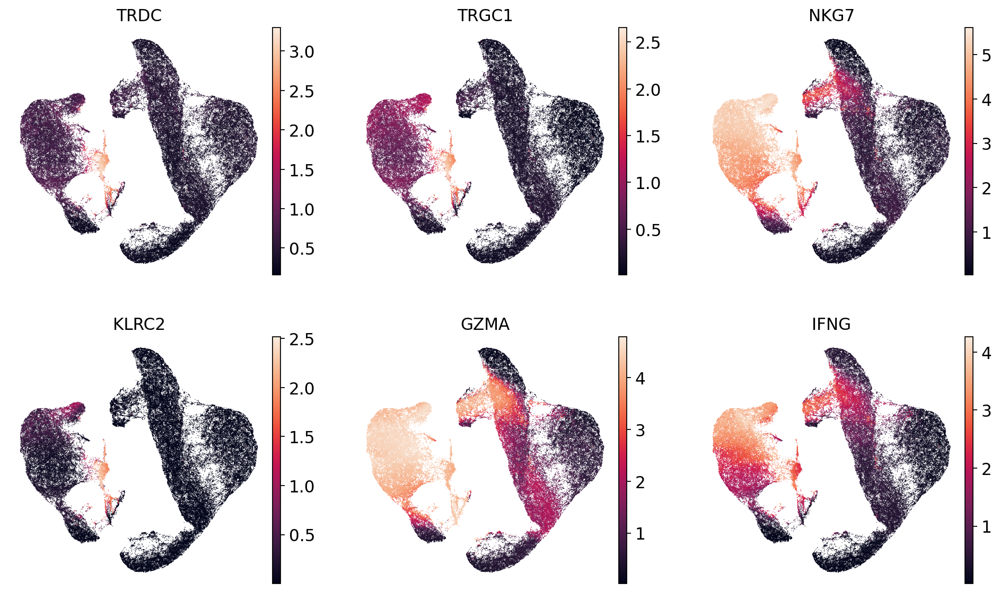

In [65]:
sc.pl.umap(adata_imputed_rna_sub, color=['TRDC', 'TRGC1', 'NKG7', 'KLRC2', 'GZMA', 'IFNG', ], ncols=3, layer = 'denoised_rna_log1p', cmap = 'rocket', frameon = False, save ='gd_Tcell_markers.png')

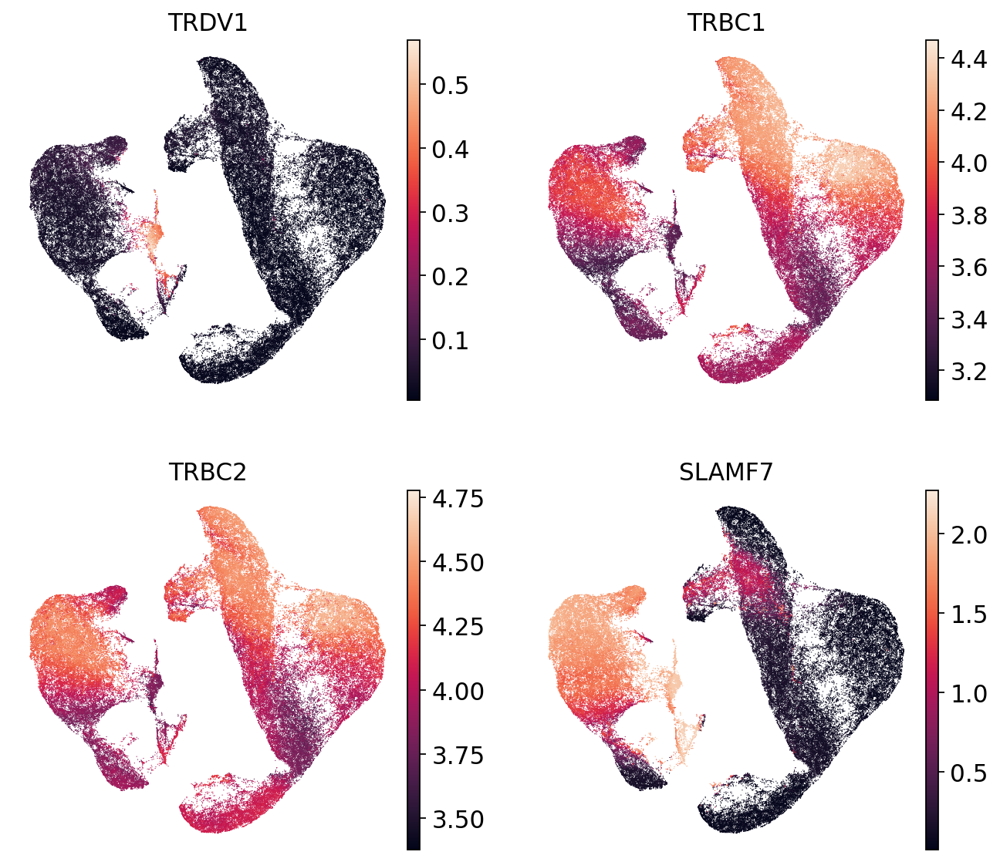

In [64]:
sc.pl.umap(adata_imputed_rna_sub, color=['TRDV1', 'TRBC1', 'TRBC2', 'SLAMF7'], ncols=2, layer = 'denoised_rna_log1p', cmap = 'rocket', frameon = False, save ='gd_Tcell_markers_sub.png')

# CITE-seq validation of gd T cells using SCVI

In [ ]:
# train scvi model on RNA only
scvi.model.SCVI.setup_anndata(
    adata_rna,
    layer="counts",
    batch_key = 'Run'
)

model_rna = scvi.model.SCVI(adata_rna)
model_rna.train(max_epochs = 100, batch_size = 2000)

In [ ]:
adata_rna.obsm['X_scVI'] = model_rna.get_latent_representation()
sc.pp.neighbors(adata_rna, use_rep='X_scVI')
sc.tl.umap(adata_rna)
sc.tl.leiden(adata_rna, resolution = 1.2)

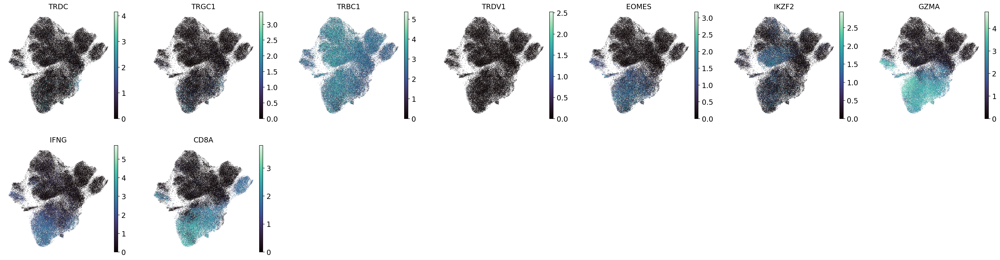

In [14]:
sc.pl.umap(adata_rna, color=['TRDC', 'TRGC1', 'TRBC1', 'TRDV1', 'EOMES', 'IKZF2', 'GZMA', 'IFNG', 'CD8A'], ncols=7, layer = 'normalized', cmap = 'mako', frameon = False)

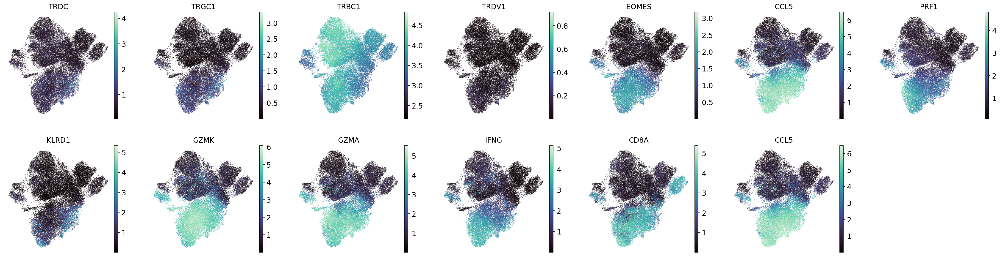

In [15]:
sc.pl.umap(adata_rna, color=['TRDC', 'TRGC1', 'TRBC1', 'TRDV1', 'EOMES', 'CCL5', 'PRF1', 'KLRD1', 'GZMK', 'GZMA', 'IFNG', 'CD8A', 'CCL5'], ncols=7, layer = 'denoised_rna_log1p', cmap = 'mako', frameon = False)

In [ ]:
sc.pl.umap(adata_rna, color=['leiden', 'Run', 'Entity'], frameon = False)

In [ ]:
sc.pl.umap(adata_rna, color='leiden', groups = ['3'], frameon = False)

In [ ]:
# subcluster cluster 3
sc.tl.leiden(adata_rna, resolution = 0.8, restrict_to = ('leiden', ['3']), key_added = 'leiden_highres')

In [ ]:
sc.pl.umap(adata_rna, color='leiden_highres', frameon = False)

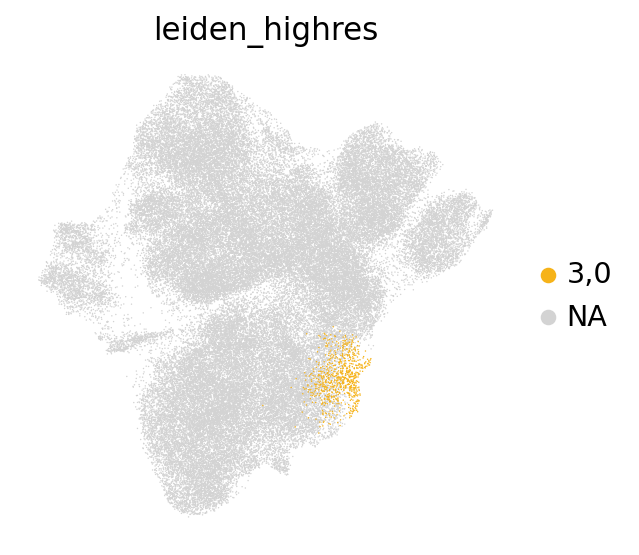

In [58]:
# plot
temp_col_pal = dict(zip([*adata_rna.obs['leiden_highres'].cat.categories], ['grey']*len([*adata_rna.obs['leiden_highres'].cat.categories])))
temp_col_pal['3,0']  = '#F6B319'

sc.pl.umap(adata_rna, color='leiden_highres', groups = ['3,0'], palette = temp_col_pal, frameon = False, save = 'CITE_seq_gdT_cell.png')

In [ ]:
sc.tl.rank_genes_groups(adata_rna, groupby='leiden_highres', groups = ['3,0'], layer = 'normalized', use_raw = False)

In [15]:
wilcox_DA10_df

,names,scores,logfoldchanges,pvals,pvals_adj
0,GZMA,592.386414,2.939727,0.0,0.0
1,GZMK,516.684204,2.722963,0.0,0.0
2,SLAMF7,506.727356,2.657931,0.0,0.0
3,AC138470.2,502.192413,1.441972,0.0,0.0
4,EOMES,477.630157,2.710177,0.0,0.0
...,...,...,...,...,...
3995,LRRC29,-503.045563,-1.180378,0.0,0.0
3996,CH25H,-504.066681,-2.403158,0.0,0.0
3997,ZC2HC1A,-523.098450,-3.909448,0.0,0.0
3998,AL133335.2,-535.529907,-2.603440,0.0,0.0


In [31]:
# create new celltype obs with gd cluster
adata_rna.obs['CellType_exp'] = adata_rna.obs['CellType'].copy().astype('str')
adata_rna.obs.loc[adata_rna.obs['CellType']=='Naïve CD8 T', 'CellType_exp'] = 'Naive CD8 T'
adata_rna.obs.loc[adata_rna.obs['CellType']=='Treg CM1', 'CellType_exp'] = 'Treg CD69-'
adata_rna.obs.loc[adata_rna.obs['CellType']=='Treg CM2', 'CellType_exp'] = 'Treg CD69+'
adata_rna.obs.loc[adata_rna.obs['CellType']=='Treg EM1', 'CellType_exp'] = 'Treg CD69+'
adata_rna.obs.loc[adata_rna.obs['CellType']=='Treg EM2', 'CellType_exp'] = 'Treg CD69+'
adata_rna.obs.loc[adata_rna.obs['leiden_highres'] == '3,0', 'CellType_exp'] = 'gd_Tcell'
adata_rna.obs['CellType_exp'] = adata_rna.obs['CellType_exp'].astype('category')

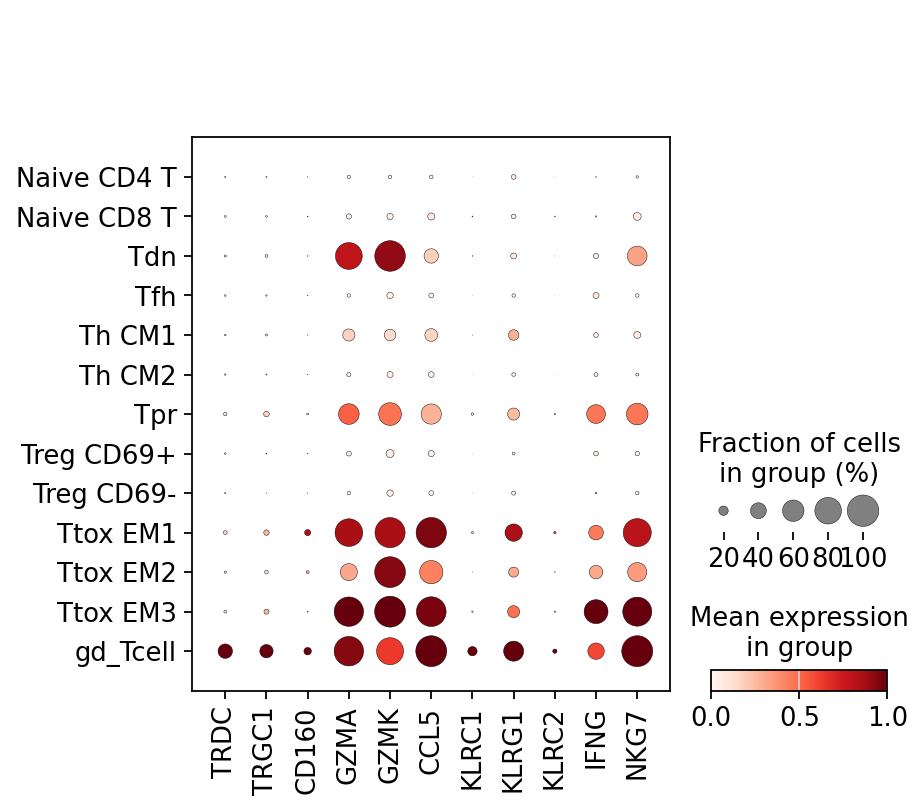

In [84]:
sc.pl.dotplot(adata_rna, groupby='CellType_exp', var_names = ['TRDC', 'TRGC1', 'CD160', 'GZMA', 'GZMK', 'CCL5', 'KLRC1', 'KLRG1', 'KLRC2', 'IFNG', 'NKG7'], standard_scale = 'var', layer = 'normalized',  save = 'gd_Tcell_markers.pdf')

In [ ]:
# # save to disk
# adata_rna.write(citeseq_data_dir + '2025-02-24_BNHL_CITEseq_combined_RNA_TotalVI_imputed_SCVI_clustered.h5ad')

In [ ]:
# model_rna.save('/home/projects/amit/floriani/Lab/PROJECTS/FlowVI/models/BNHL/2025-02-24_BNHL_citeseq_scvi', overwrite=True)

/tmp/ipykernel_8602/1437720811.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_cells_per_patient = adata_rna.obs.groupby('PatientID').size()
/tmp/ipykernel_8602/1437720811.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_cells_per_patient = cluster_data.groupby('PatientID').size()
/tmp/ipykernel_8602/1437720811.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_entities = adata_rna.obs.gr

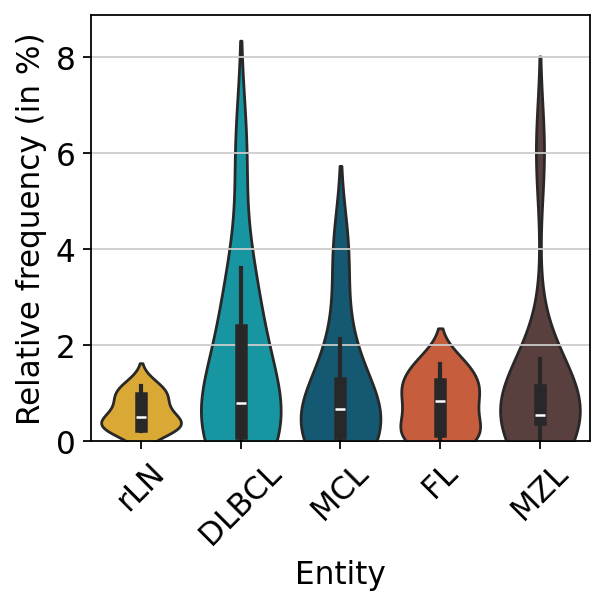

In [83]:
# plot frequency of gd T cell cluster
cluster_mask = adata_rna.obs['CellType_exp'] == 'gd_Tcell'
cluster_data = adata_rna.obs[cluster_mask]

total_cells_per_patient = adata_rna.obs.groupby('PatientID').size()

cluster_cells_per_patient = cluster_data.groupby('PatientID').size()

relative_frequency = (100*cluster_cells_per_patient / total_cells_per_patient).fillna(0)

patient_entities = adata_rna.obs.groupby('PatientID')['Entity'].first()

# Create a DataFrame for plotting
freq_df = pd.DataFrame({
    'RelativeFrequency': relative_frequency,
    'Entity': patient_entities
}).reset_index()

# plot violins
plt.figure(figsize=(4, 4))
sns.violinplot(
        data=freq_df,
        x='Entity',
        y='RelativeFrequency',
        hue='Entity',
        order=group_order,
        palette=color_dict_entities,
        inner='box'
    )

# compute p val and annotate
rLN_data = freq_df[freq_df['Entity'] == 'rLN']['RelativeFrequency'].dropna() 
for j, entity in enumerate(group_order):
    if entity == 'rLN':
        continue
    entity_data = freq_df[freq_df['Entity'] == entity]['RelativeFrequency'].dropna()
        
    # Mann-Whitney U
    if len(rLN_data) > 0 and len(entity_data) > 0:
        try:
            p_value = mannwhitneyu(rLN_data, entity_data, alternative='two-sided').pvalue
            # add label
            plt.text(
                    x=j,  
                    y=freq_df['RelativeFrequency'].max() * 1.05, 
                    s=f"p={p_value:.2e}" if p_value < 0.05 else "",
                    ha='center',
                    fontsize=7,
                    color='black'
                )
        except ValueError:
            pass

# Customize the plot
plt.xlabel("Entity")
plt.ylabel("Relative frequency (in %)")
plt.xticks(rotation=45)
plt.ylim(bottom=0)
plt.tight_layout()

# Show the plot
plt.savefig(figure_dir + 'gd T_cell_cluster_CITEseq_violin.pdf')